In [ ]:
im = Image.open("./parrot.png") # read the image, provide the correct path
print(im.width, im.height, im.mode, im.format, type(im))
# 453 340 RGB PNG <class 'PIL.PngImagePlugin.PngImageFile'>
im.show() # display the image

In [63]:
#% matplotlib inline
import skimage 
print(skimage.__version__)
import numpy as np
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract, multiply, difference, screen
import PIL.ImageStat as stat
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
from skimage import color ,exposure,data,img_as_float,io #viewer since 2021 due to maintanence issues scikit-image doesn't carry viewer
from skimage.transform import SimilarityTransform, warp, swirl
from skimage.util import invert, random_noise, montage
import matplotlib.image as mpimg
import matplotlib.pylab as plt
from scipy.ndimage import affine_transform, zoom
from scipy import misc
from matplotlib.pyplot import imshow,show,axis,imsave #,plt
from skimage.color import rgb2gray

0.21.0


In [ ]:
im_g = im.convert('L') # convert the RGB color image to a grayscale image
im_g.save('./parrot_gray.png') # save the image to disk
Image.open("./parrot_gray.png").show() # read the grayscale image from disk and show

(960, 1280, 4) float32 <class 'numpy.ndarray'>


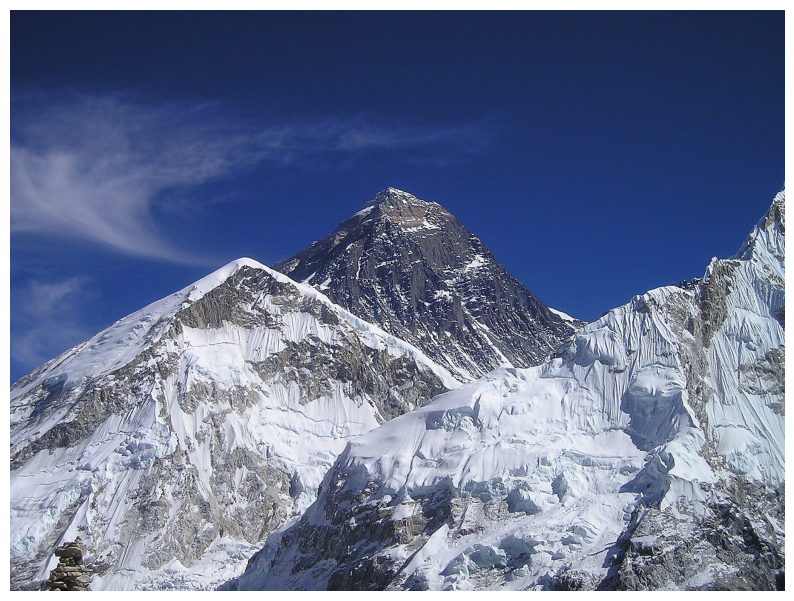

In [9]:
im = mpimg.imread("./hill.png") # read the image from disk as a numpy ndarray
print(im.shape, im.dtype, type(im)) # this image contains an α channel, hence num_channels= 4
# (960, 1280, 4) float32 <class 'numpy.ndarray'>
plt.figure(figsize=(10,10))
plt.imshow(im) # display the image
plt.axis('off')
plt.show()

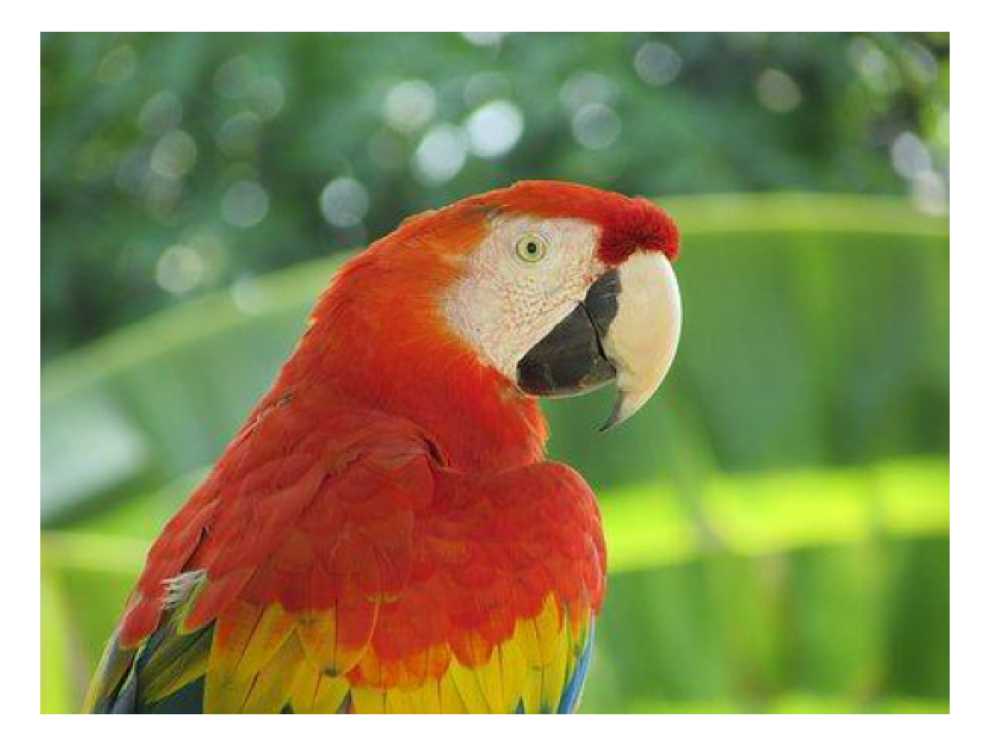

In [9]:
im1 = im
im1[im1 < 0.5] = 0 # make the image look darker
plt.imshow(im1)
plt.axis('off')
plt.tight_layout()
plt.savefig("./hill_dark.png") # save the dark image
plt.close()
im = mpimg.imread("./hill_dark.png") # read the dark image
plt.figure(figsize=(10,10))
plt.imshow(im)
plt.axis('off') # no axis ticks
plt.tight_layout()
plt.show()

In [2]:
%pip install scikit-image

Defaulting to user installation because normal site-packages is not writeable


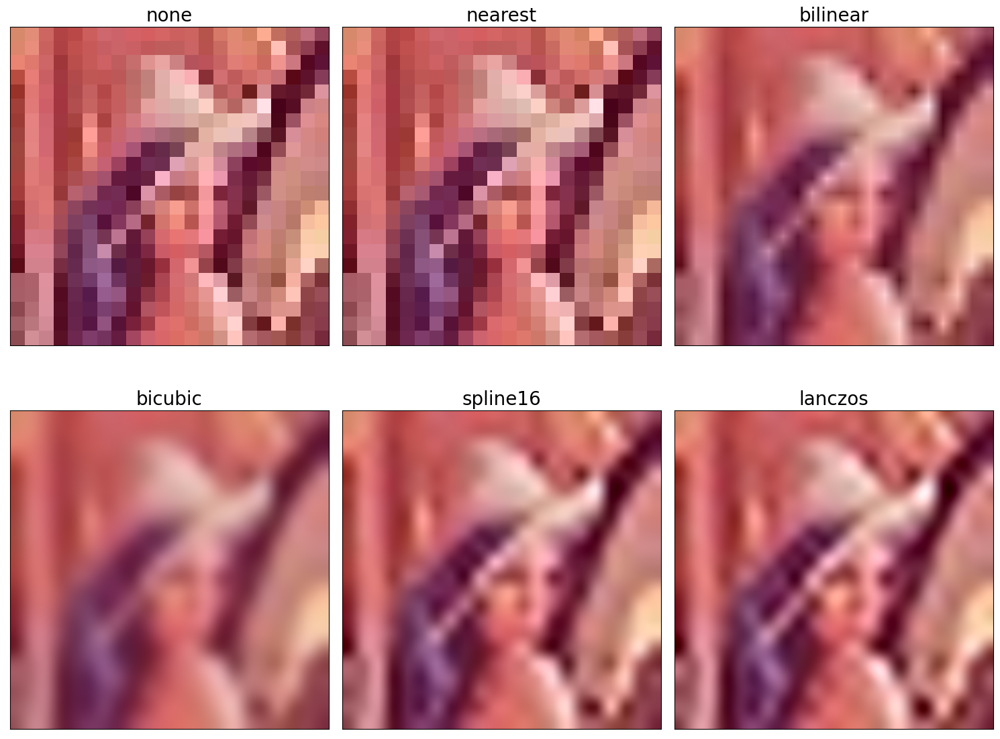

In [11]:
im = mpimg.imread("./lena_small.jpg") # read the image from disk as a numpy ndarray
methods = ['none', 'nearest', 'bilinear', 'bicubic', 'spline16', 'lanczos']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 12), subplot_kw={'xticks': [], 'yticks': []})
fig.subplots_adjust(hspace=0.05, wspace=0.05)
for ax, interp_method in zip(axes.flat, methods):
    ax.imshow(im, interpolation=interp_method)
    ax.set_title(str(interp_method), size=20)
plt.tight_layout()
plt.show()

(340, 453, 3) uint8 <class 'numpy.ndarray'>


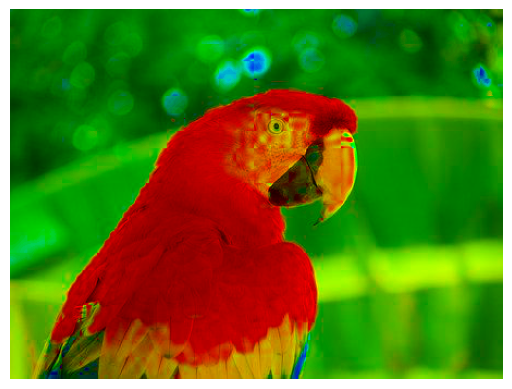

NameError: name 'viewer' is not defined

In [20]:
im = imread("./parrot.png") # read image from disk, provide the correct path
print(im.shape, im.dtype, type(im))
hsv = color.rgb2hsv(im) # from RGB to HSV color space
hsv[:, :, 1] = 1.5 # change the saturation
im1 = color.hsv2rgb(hsv) # from HSV back to RGB
im1_scaled = (im1*255).clip(0,255).astype(np.uint8)
imsave("./parrot_hsv.png", im1_scaled) # save image to disk
im = imread("./parrot_hsv.png")
axis('off')
imshow(im)
show()


In [3]:
#viewer = viewer.ImageViewer(im)
#viewer.show()

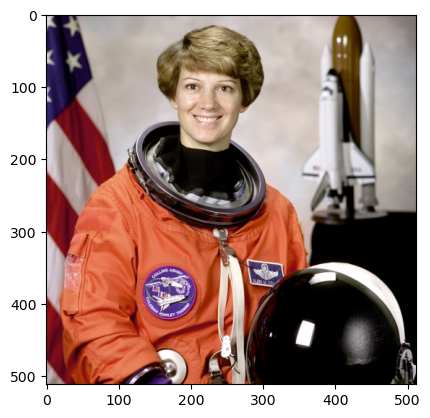

(<matplotlib.image.AxesImage at 0x7fe863f998a0>, None)

In [31]:
im = data.astronaut()
imshow(im), show()

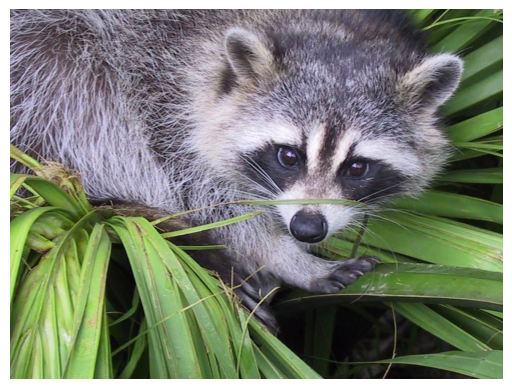

(<matplotlib.image.AxesImage at 0x7f99dcbf18a0>,
 (-0.5, 1023.5, 767.5, -0.5),
 None)

In [6]:
from scipy import misc

im = misc.face() # load the raccoon's face image
imsave('face.png', im) # uses the Image module (PIL)
plt.imshow(im), plt.axis('off'), plt.show() #imsave fxn from scipy.misc has been deprecated and removed in newer versions of scipy

In [10]:
#im = misc.imread('../images/pepper.jpg') misc doesn't have imread fxn for now
im = io.imread("./pepper.jpg")
print(type(im), im.shape, im.dtype)
# <class 'numpy.ndarray'> (225, 225, 3) uint8

<class 'numpy.ndarray'> (225, 225, 3) uint8


In [11]:
im = Image.open("./parrot.png")
print(im.mode)
im.save("./parrot.jpg")

RGB


In [12]:
im = Image.open("./hill.png")
print(im.mode)
im.convert('RGB').save("./hill.jpg")

RGBA


<Figure size 640x480 with 0 Axes>

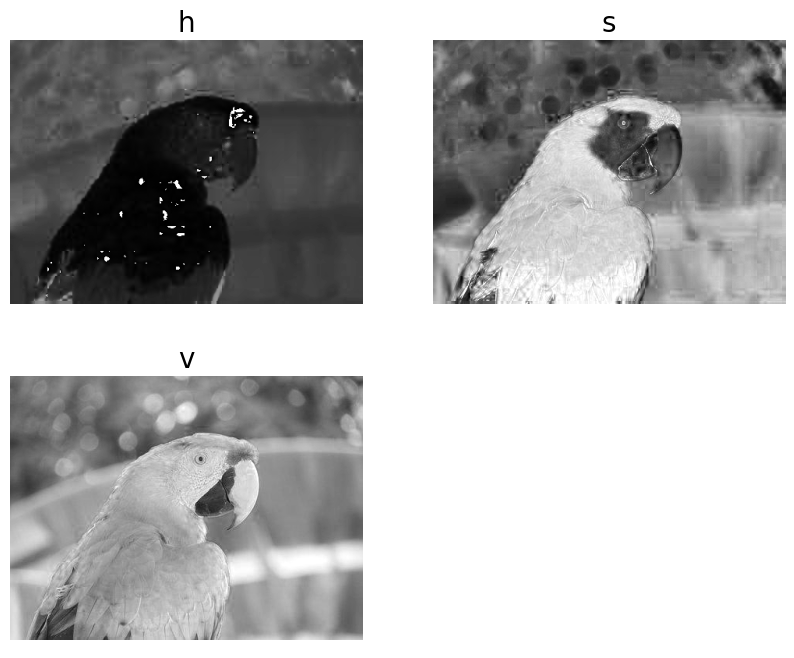

In [13]:
im = imread("./parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221),plt.imshow(im_hsv[...,0]), plt.title('h',size=20)
plt.axis('off')
plt.subplot(222),plt.imshow(im_hsv[...,1]),plt.title('s',size=20)
plt.axis('off')
plt.subplot(223),plt.imshow(im_hsv[...,2]),plt.title('v',size=20)
plt.axis('off')
plt.subplot(224),plt.axis('off')
plt.show()

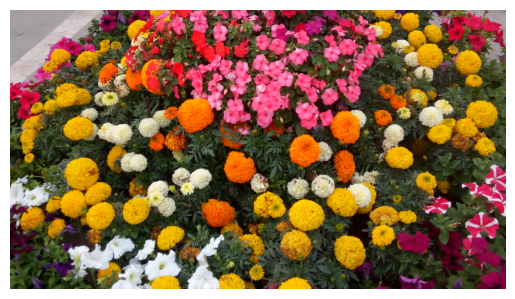

((-0.5, 4095.5, 2303.5, -0.5), None)

In [15]:
#CONVERTING IMAGE DATA STRUCTURES
im = Image.open('./flowers.png')#read image into Image object with PIL
im = np.array(im) #create a numpy ndarray from image object
imshow(im) #use skimage imshow to display the image
plt.axis('off'),show()


In [16]:
im = imread('./flowers.png')#read image into numpy ndarray with skimage
im = Image.fromarray(im) #create a PIL Image object from the numpy ndarray
im.show() #display the image with PIL Image.show() method

(340, 453)


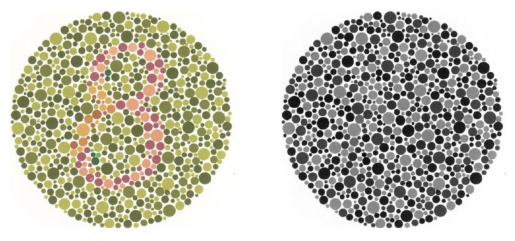

In [13]:
im = imread('./parrot.png', as_gray=True)
print(im.shape)
im = imread('./Ishihara.png')
im_g = color.rgb2gray(im)
plt.subplot(121),plt.imshow(im,cmap='gray'),plt.axis('off')
plt.subplot(122),plt.imshow(im_g,cmap='gray'),plt.axis('off')
plt.show()

<Figure size 640x480 with 0 Axes>

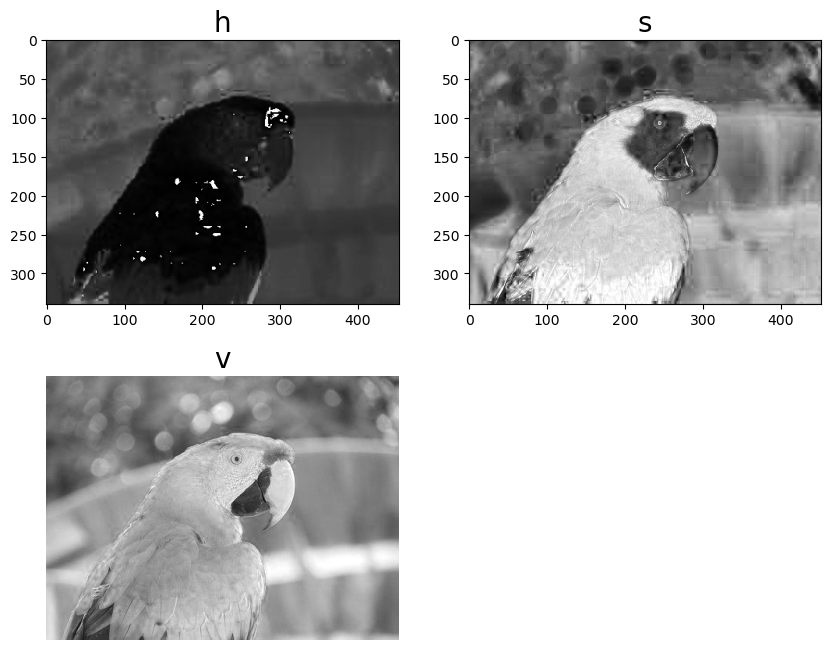

In [16]:
im = imread("./parrot.png")
im_hsv = color.rgb2hsv(im)
plt.gray()
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im_hsv[...,0]),plt.title('h',size=20),
plt.axis('on')
plt.subplot(222), plt.imshow(im_hsv[...,1]),plt.title('s',size=20),
plt.axis('on')
plt.subplot(223), plt.imshow(im_hsv[...,2]),plt.title('v',size=20),
plt.axis('off')
plt.subplot(224),plt.axis('off')
plt.show()

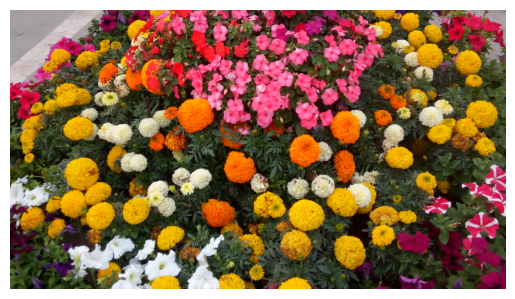

((-0.5, 4095.5, 2303.5, -0.5), None)

In [17]:
im = Image.open('./flowers.png')#read image into an Image object with PIL
im = np.array(im) #create numpy ndarray from the image object
imshow(im) #use skimage imshow to display image
plt.axis('off'),show()

In [11]:
from PIL import Image
#im = imread("./flowers.png") #read image into numpy ndarray with skimage
#Mixing these two libraries directly might cause compatibility issues.

#To correct the code and make it work, you should choose one of the libraries to work with
im = Image.open("./flowers.png") #create a PIL Image object from the numpy ndarray
im.show() #display the image with PIL Image.show() method

[180  76  83]


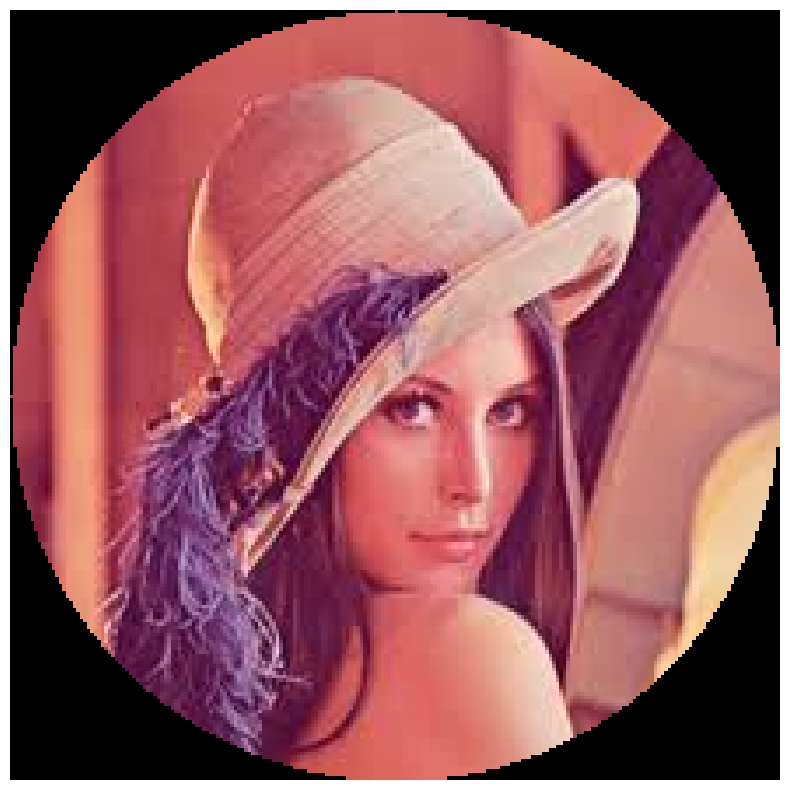

(<matplotlib.image.AxesImage at 0x7fd666ea9090>,
 (-0.5, 219.5, 219.5, -0.5),
 None)

In [15]:
#Image manipulations with numpy array slicing 
lena = mpimg.imread("./lena.jpg") #read the image from disk as numpy ndarray
print(lena[0,40])
lx,ly,_=lena.shape
X,Y = np.ogrid[0:lx,0:ly]
mask = (X - lx/2)**2 + (Y-ly/2)**2 > lx*ly/4
lena[mask,:] = 0 #masks
plt.figure(figsize=(10,10))
plt.imshow(lena), plt.axis('off'), plt.show()

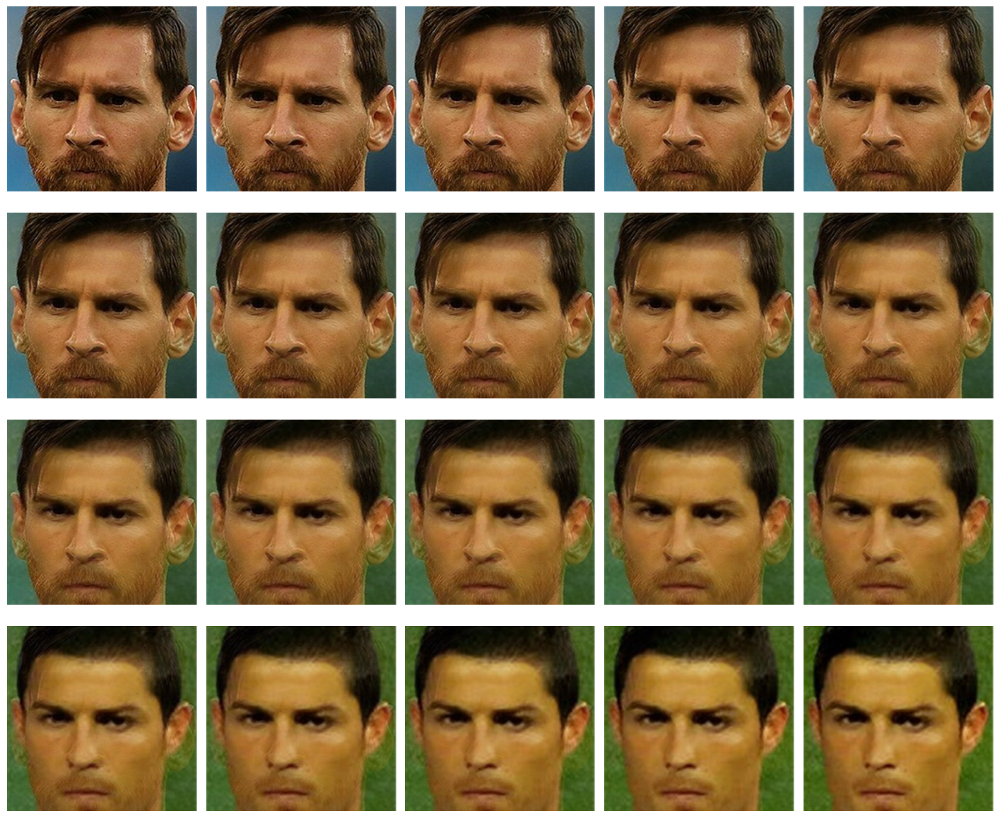

In [17]:
im1 = mpimg.imread("./messi.jpg") / 255 # scale RGB values in [0,1]
im2 = mpimg.imread("./ronaldo.jpg") / 255
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
    plt.subplot(4,5,i)
    plt.imshow((1-alpha)*im1 + alpha*im2)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0.05, hspace=0.05)
plt.show()

In [18]:
im = Image.open("./parrot.png") # open the image, provide the correct path
print(im.width, im.height, im.mode, im.format) # print image size, mode and format

453 340 RGB PNG


In [19]:
im_c = im.crop((175,75,320,200)) # crop the rectangle given by (left, top, right, bottom) from the image
im_c.show()

In [21]:
im = Image.open("./clock.jpg")
print(im.width, im.height)
im.show()


107 105


In [22]:
im_large = im.resize((im.width*5, im.height*5), Image.BILINEAR) # bi-linear interpolation

In [24]:
im = Image.open("./victoria_memorial.png")
print(im.width, im.height)
im.show()

720 540


In [25]:
im_small = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)

In [26]:
im = Image.open("./parrot.png")
im_t = im.point(lambda x: 255 - x)
im_t.show()

In [27]:
im_g = im.convert('L') # convert the RGB color image to a grayscale 

In [31]:
from PIL import Image
import numpy as np
im = Image.open("./flowers.png")

# Apply the logarithmic transformation to each pixel
transformed_im = Image.fromarray(np.uint8(np.vectorize(lambda x: 255 * np.log(1 + x / 255))(np.array(im))))

# Display the transformed image
transformed_im.show()



In [32]:
from PIL import Image, ImageFilter

# Read the image using PIL
im = Image.open("flowers.png")

# Define a gamma correction function
def gamma_correction(value, gamma=0.6):
    return int(255 * (value / 255) ** gamma)

# Apply the gamma correction to each pixel in the image
im_corrected = im.point(lambda p: gamma_correction(p, gamma=0.6))

# Show the corrected image
im_corrected.show()

In [34]:
im.transpose(Image.FLIP_LEFT_RIGHT).show() # reflect about the vertical axis

In [35]:
im_45 = im.rotate(45) # rotate the image by 45 degrees
im_45.show() # show the rotated image

In [37]:
im = Image.open("./parrot.png")
im.transform((int(1.4*im.width), im.height), Image.AFFINE,
data=(1,-0.5,0,0,1,0)).show() # shear

In [38]:
params = [1, 0.1, 0, -0.1, 0.5, 0, -0.005, -0.001]
im1 = im.transform((im.width//3, im.height), Image.PERSPECTIVE, params,
Image.BICUBIC)
im1.show()

In [39]:
# choose 5000 random locations inside image
im1 = im.copy() # keep the original image, create a copy
n = 5000
x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height,n)
for (x,y) in zip(x,y):
    im1.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # salt-and-pepper noise
im1.show()

In [41]:
im = Image.open("./parrot.png")
draw = ImageDraw.Draw(im)
draw.ellipse((125, 125, 200, 250), fill=(255,255,255,128))
del draw
im.show()

In [47]:
from PIL import Image, ImageDraw, ImageFont
im = Image.open("./parrot.png")
draw = ImageDraw.Draw(im)
font = ImageFont.truetype("arial.ttf", 23) # use a truetype font
draw.text((10, 5), "Welcome to image processing with python", font=font)
del draw
im.show()

In [48]:
im = Image.open("./parrot.png")
im_thumbnail = im.copy() # need to copy the original image first
im_thumbnail.thumbnail((100,100)) # now paste the thumbnail on the image
im.paste(im_thumbnail, (10,10))
im.save("./parrot_thumb.jpg")
im.show()

In [49]:
s = stat.Stat(im)
print(s.extrema) # maximum and minimum pixel values for each channel R, G, B
print(s.count)
print(s.mean)
print(s.median)
print(s.stddev)

[(0, 255), (0, 255), (0, 253)]
[154020, 154020, 154020]
[127.62875600571354, 124.87831450460979, 67.90167510712894]
[121, 130, 62]
[47.684082549676965, 52.24710084416372, 39.90999669801631]


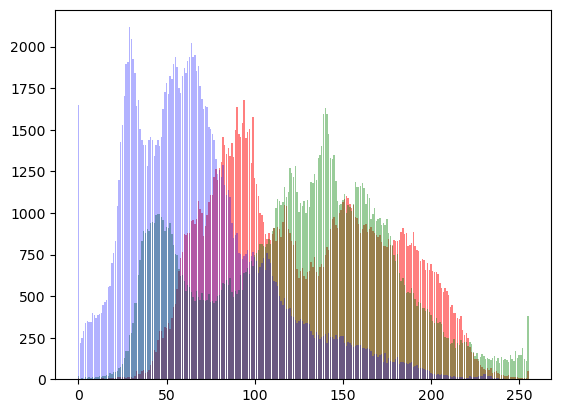

In [50]:
pl = im.histogram()
plt.bar(range(256), pl[:256], color='r', alpha=0.5)
plt.bar(range(256), pl[256:2*256], color='g', alpha=0.4)
plt.bar(range(256), pl[2*256:], color='b', alpha=0.3)
plt.show()

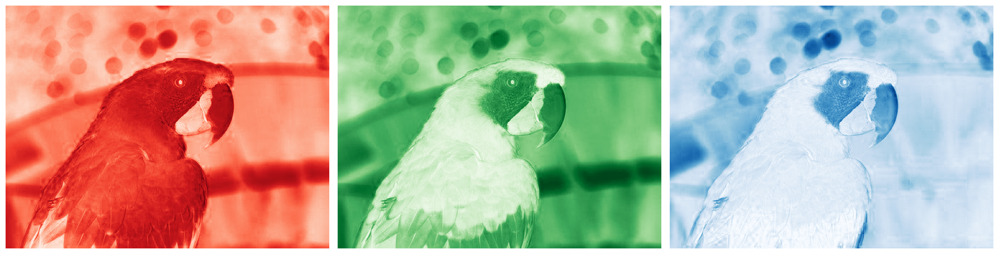

In [51]:
im = Image.open("./parrot.png")
ch_r, ch_g, ch_b = im.split() # split the RGB image into 3 channels: R, G and B
# we shall use matplotlib to display the channels
plt.figure(figsize=(18,6))
plt.subplot(1,3,1); plt.imshow(ch_r, cmap=plt.cm.Reds); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(ch_g, cmap=plt.cm.Greens); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(ch_b, cmap=plt.cm.Blues); plt.axis('off')
plt.tight_layout()
plt.show() # show the R, G, B channels

In [52]:
im = Image.merge('RGB', (ch_b, ch_g, ch_r)) # swap the red and blue channels obtained last time with split()
im.show()

In [53]:
im1 = Image.open("./parrot.png")
im2 = Image.open("./hill.png")
im1 = im1.convert('RGBA') # two images have different modes, must be converted to the same mode
im2 = im2.resize((im1.width, im1.height), Image.BILINEAR) # two images have different sizes, must be converted to the same size
im = Image.blend(im1, im2, alpha=0.5).show()

In [54]:
im1 = Image.open("./parrot.png")
im2 = Image.open("./hill.png").convert('RGB').resize((im1.width, im1.height))
multiply(im1, im2).show()

In [55]:
add(im1, im2).show()

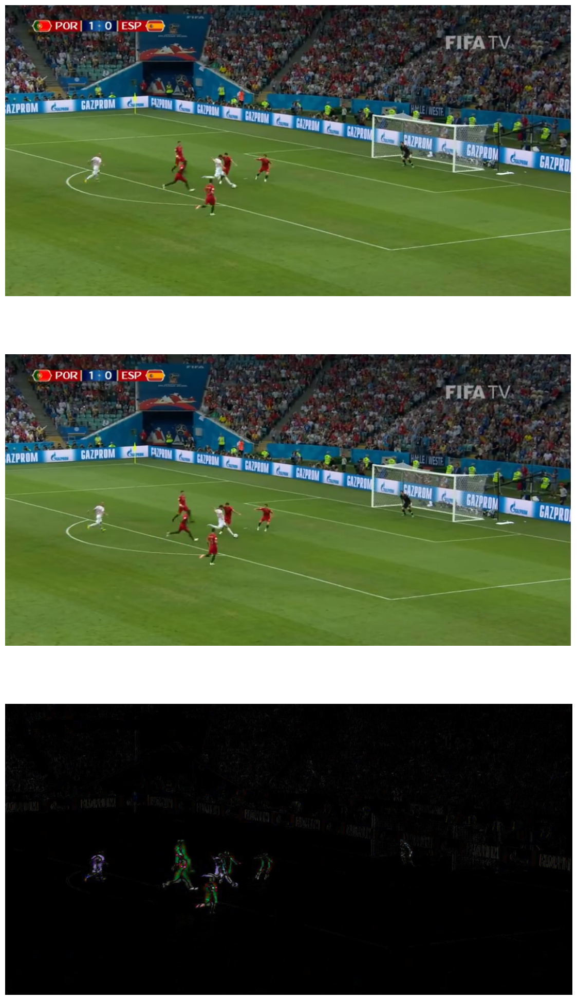

In [57]:
from PIL.ImageChops import subtract, multiply, screen, difference, add
im1 = Image.open("./goal1.png") # load two consecutive frame images from the video
im2 = Image.open("./goal2.png")
im = difference(im1, im2)
plt.figure(figsize=(20,25))
im.save("./goal_diff.png")
plt.subplot(311)
plt.imshow(im1)
plt.axis('off')
plt.subplot(312)
plt.imshow(im2)
plt.axis('off')
plt.subplot(313)
plt.imshow(im), plt.axis('off')
plt.show()

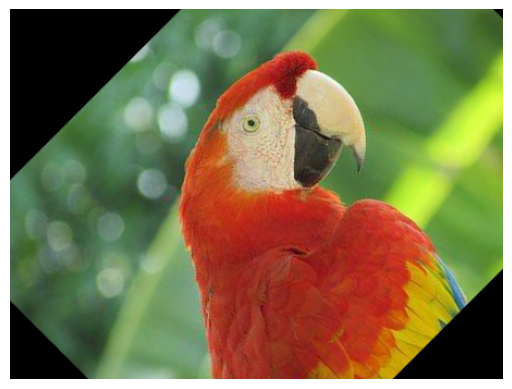

(<matplotlib.image.AxesImage at 0x7fd664dc9ed0>,
 (-0.5, 452.5, 339.5, -0.5),
 None)

In [58]:
im = imread("./parrot.png")
tform = SimilarityTransform(scale=0.9,
rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
import matplotlib.pyplot as plt
plt.imshow(warped), plt.axis('off'), plt.show()

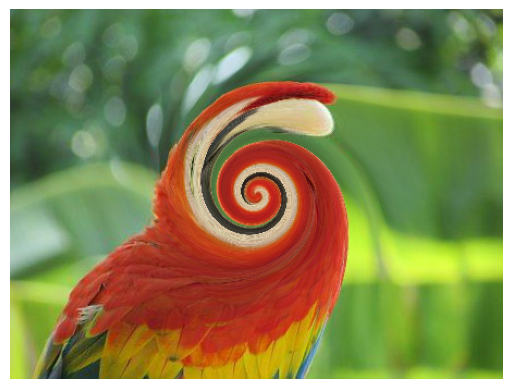

In [59]:
im = imread("./parrot.png")
swirled = swirl(im, rotation=0, strength=15, radius=200)
plt.imshow(swirled)
plt.axis('off')
plt.show()

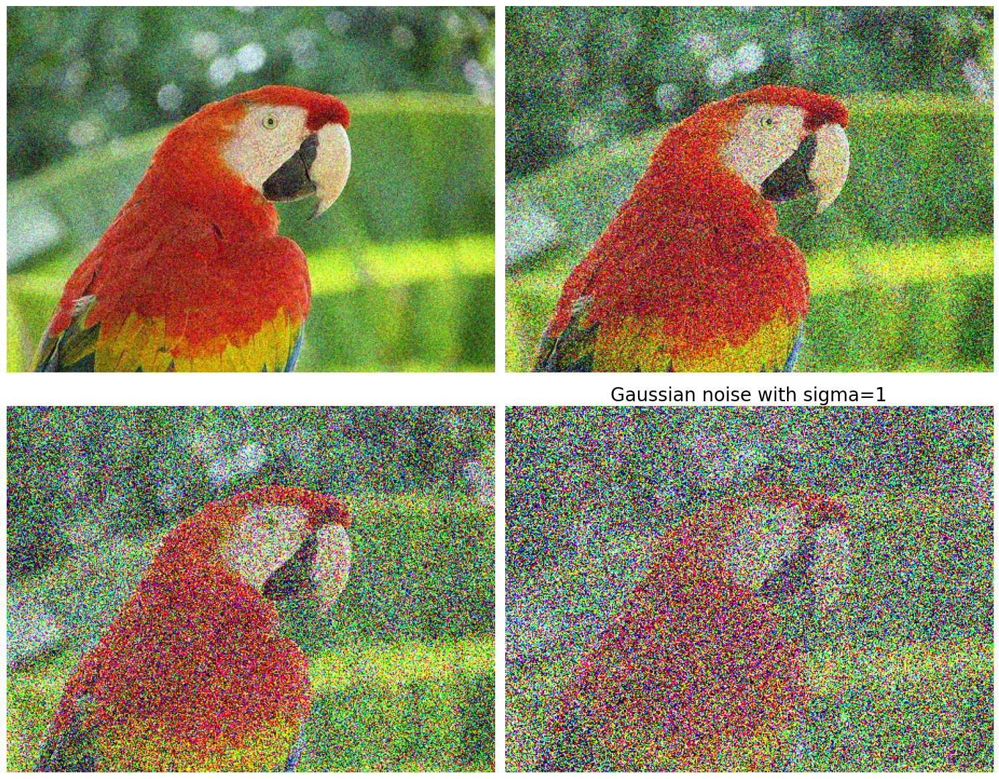

In [60]:
im = img_as_float(imread("./parrot.png"))
plt.figure(figsize=(15,12))
sigmas = [0.1, 0.25, 0.5, 1]
for i in range(4):
    noisy = random_noise(im, var=sigmas[i]**2)
    plt.subplot(2,2,i+1)
    plt.imshow(noisy)
    plt.axis('off')
plt.title('Gaussian noise with sigma=' + str(sigmas[i]), size=20)
plt.tight_layout()
plt.show()

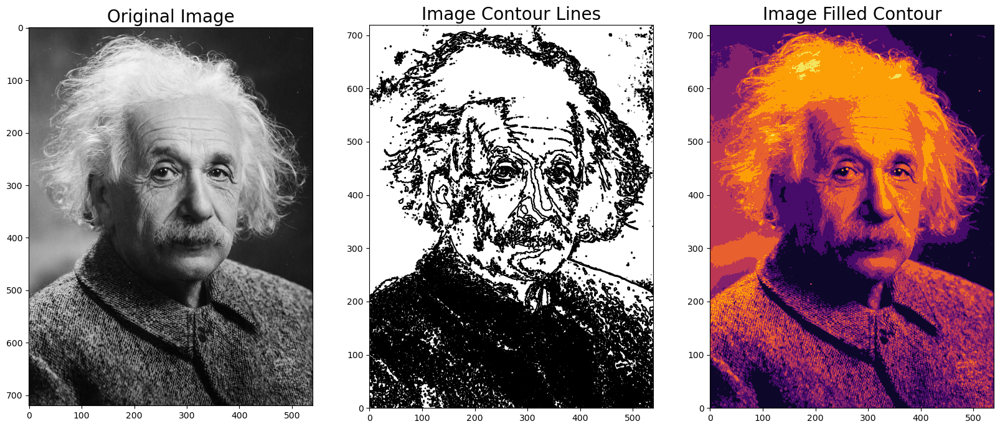

In [67]:
from skimage.color import rgb2gray
im = io.imread("./einstein.jpg", as_gray=True)
 # read the image from disk as a numpy ndarray
plt.figure(figsize=(20,8))
plt.subplot(131), plt.imshow(im, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(132), plt.contour(np.flipud(im), colors='k',
levels=np.logspace(-15, 15, 100))
plt.title('Image Contour Lines', size=20)
plt.subplot(133), plt.title('Image Filled Contour', size=20),
plt.contourf(np.flipud(im), cmap='inferno')
plt.show()